# Western Balkan Studies

* load packages

In [1]:
import warnings
from pathlib import Path

import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import rasterio as rio
import rioxarray as rxr
import numpy as np

import RES.visuals as vis
from RES import utility as utils
from RES.hdf5_handler import DataHandler
import RES.utility as utlis

plt.style.use('../RES/visual_styles/elsevier.mplstyle')
# Suppress specific warnings
warnings.filterwarnings("ignore", category=UserWarning)


## Load Config and Define Regions List

In [2]:
cfg=utils.load_config('../config/config_WB6.yaml')
sub_national_unit_tag=cfg.get('GADM').get('datafield_mapping').get('NAME_2')
country_name=cfg.get('country','Western Balkan Region') # type: ignore
country_kwd=country_name.replace(' ','')

regions=['AL','BA','XK','ME','RS','MK']  #'AL','BA','XK','ME','MK','RS'

## Load Store

In [3]:
RUN_ID = 'vre_low' #All the regions should have RUN_ID results available
WB6_store = {}
utils.print_update(level=1,message=f"Loading data stores for WB6 regions with RUN_ID: {RUN_ID} and Regions: {regions}")
for region in regions:
    country_dict = {}
    try:
        store = Path(f"../data/store/resources_{country_kwd}_{region}_{RUN_ID}.h5")
        assert store.exists(), f"Store path doesn't exist: {store}"
        res_data = DataHandler(store, show_structure=False)
        country_dict['cells'] = res_data.from_store('cells')
        country_dict['boundary'] = res_data.from_store('boundary')
        country_dict['lines'] = res_data.from_store('lines')
        WB6_store[region] = country_dict
        utils.print_update(level=2,message=f"✓ Loaded data for region: {region}") 
    except Exception as e:
        print(f"X Error with region {region}: {e}")
        continue

└> Loading data stores for WB6 regions with RUN_ID: vre_low and Regions: ['AL', 'BA', 'XK', 'ME', 'RS', 'MK']
 └> ✓ Loaded data for region: AL
 └> ✓ Loaded data for region: BA
 └> ✓ Loaded data for region: XK
 └> ✓ Loaded data for region: ME
 └> ✓ Loaded data for region: RS
 └> ✓ Loaded data for region: MK


# Load Test/Validation data

In [4]:
existing_VREs_data_path=Path("../data/validation_data/existing_VREs_WB6.csv")
if existing_VREs_data_path.exists():
    existing_VREs=pd.read_csv(existing_VREs_data_path)
    existing_VREs_gdf=gpd.GeoDataFrame(existing_VREs,geometry=gpd.points_from_xy(existing_VREs.Longitude,existing_VREs.Latitude),crs="EPSG:4326")
    utils.print_update(level=1,message=f"✓ Loaded validation data for existing VREs from {existing_VREs_data_path}")
else:
    existing_VREs_gdf=None
    utils.print_warning(f"Validation data for existing VREs not found at {existing_VREs_data_path}")

└> ✓ Loaded validation data for existing VREs from ../data/validation_data/existing_VREs_WB6.csv


# Corine Land Cover

- Define Raster Path (all EUROPE) and Classes Mapping

In [5]:
CLC_raster_path = Path('../data/downloaded_data/CORINE/U2018_CLC2018_V2020_20u1.tif')
# corine_classes=utlis.load_config('../data/downloaded_data/CORINE/CLC_2018_landclasses.yaml')
CLC_legends=pd.read_csv("../data/CLC_2018_legend.csv")
class_inclusion_layers:dict=cfg.get('CORINE').get('raster_types')[0]['class_inclusion']

- Create a WB6 boundary for plotting purposes

In [6]:
# Combine all region boundaries into a single GeoDataFrame
boundary_gdfs = [WB6_store[region]['boundary'] for region in WB6_store]
WB6_boundary = gpd.GeoDataFrame(pd.concat(boundary_gdfs, ignore_index=True), crs=boundary_gdfs[0].crs)
WB6_boundary_dissolved = WB6_boundary.dissolve(by="Country")[["geometry"]].reset_index()

- Process the boundary info for raster plotting

In [7]:
WB6_boundary_dissolved_reproj=WB6_boundary_dissolved.to_crs(epsg=3035)
# Get total bounds from boundary GeoDataFrame
minx, miny, maxx, maxy = WB6_boundary_dissolved_reproj.total_bounds

# Create bounding_box_dict with correct keys for downstream use
bounding_box_dict = {
    "minx": float(minx),
    "miny": float(miny),
    "maxx": float(maxx),
    "maxy": float(maxy)
}

-load raster cropped to WB6 boundary

In [8]:
CLC_raster_data = (
            rxr.open_rasterio(CLC_raster_path)
            .rio.clip_box(**bounding_box_dict)
        )

# Suppose we already loaded corine_classes dict (code → name)
codes = np.unique(CLC_raster_data.values[~np.isnan(CLC_raster_data.values)])
codes = codes.astype(int)

- Plot CLC + Existing VREs + Boundaries

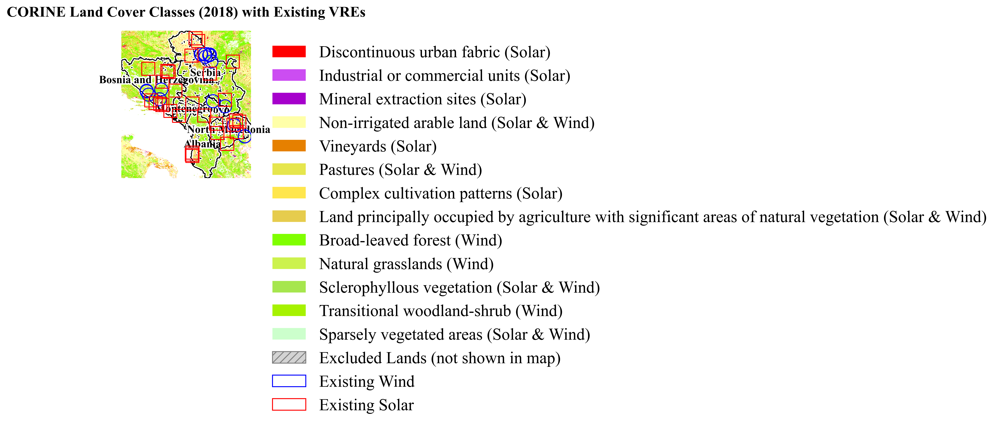

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap, BoundaryNorm, to_rgba
from matplotlib.patches import Patch
from pathlib import Path
import matplotlib.patheffects as pe

# ---------- Legend helpers ----------
id_to_name = dict(zip(CLC_legends["class"].astype(int), CLC_legends["description"].astype(str)))
id_to_hex  = dict(zip(CLC_legends["class"].astype(int), CLC_legends["color"].astype(str)))
developable_classes = set(class_inclusion_layers['solar'] + class_inclusion_layers['wind'])

# ---------- Pick ONE map CRS ----------
# Prefer boundary CRS (usually projected), else fall back to raster CRS
target_crs = WB6_boundary_dissolved_reproj.crs
if target_crs is None:
    # As a last resort, set the raster CRS (EDIT if your raster is not WGS84)
    CLC_raster_data = CLC_raster_data.rio.write_crs("EPSG:3035", inplace=False)
    target_crs = CLC_raster_data.rio.crs

# ---------- Ensure raster in target CRS ----------
if CLC_raster_data.rio.crs != target_crs:
    CLC_plot = CLC_raster_data.rio.reproject(target_crs)
else:
    CLC_plot = CLC_raster_data

# ---------- Build masked raster in THIS grid ----------
clc = CLC_plot.values.squeeze().astype("int32")
codes_present = np.unique(clc)

clc_masked = np.full_like(clc, -1, dtype="int32")
# Only keep developable classes
keep = np.intersect1d(codes_present, np.array(list(developable_classes), dtype="int32"))
for c in keep:
    clc_masked[clc == c] = c

# Discrete colormap + norm (include transparent -1)
color_map_dict = {-1: (0, 0, 0, 0)}
for c in sorted(developable_classes):
    color_map_dict[c] = to_rgba(id_to_hex.get(c, "#888888"))
all_vals = sorted(color_map_dict.keys())
cmap = ListedColormap([color_map_dict[v] for v in all_vals])
norm = BoundaryNorm(np.array(all_vals + [all_vals[-1] + 1]), cmap.N)

# ---------- Extent/bounds from reprojected raster ----------
xmin, ymin, xmax, ymax = CLC_plot.rio.bounds()
x = CLC_plot.coords["x"].values
y = CLC_plot.coords["y"].values
extent = [float(x.min()), float(x.max()), float(y.min()), float(y.max())]
origin = "upper" if y[0] > y[-1] else "lower"

# ---------- Reproject vectors to SAME CRS ----------
existing_VREs_clean = existing_VREs_gdf.copy()
existing_VREs_clean["Technology"] = existing_VREs_clean["Technology"].fillna("").astype(str)
existing_VREs_proj = existing_VREs_clean.to_crs(target_crs)

# ---------- Plot ----------
fig, ax = plt.subplots(figsize=(12, 9))

# Raster first
ax.imshow(clc_masked, extent=extent, origin=origin,
          cmap=cmap, norm=norm, interpolation="nearest", zorder=0)

# Lock axes to raster bounds so points aren’t plotted “off canvas”
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Boundaries with halo + labels
for idx, row in WB6_boundary_dissolved_reproj.iterrows():
    WB6_boundary_dissolved_reproj.iloc[[idx]].plot(ax=ax, facecolor='none', edgecolor='white', linewidth=3, zorder=2)
    WB6_boundary_dissolved_reproj.iloc[[idx]].plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, zorder=3)
    c = row.geometry.centroid
    ax.annotate(row["Country"], (c.x, c.y), ha="center", va="center",
                fontsize=12, fontweight="bold", color="black",
                path_effects=[pe.withStroke(linewidth=3, foreground="white")])

# Existing VREs (now same CRS)
is_wind  = existing_VREs_proj["Technology"].str.lower().str.contains("wind")
is_solar = existing_VREs_proj["Technology"].str.lower().str.contains("solar")

# Use a visible facecolor briefly to verify overlap; switch to 'none' after validation
existing_VREs_proj[is_wind].plot(
    ax=ax, facecolor='None', edgecolor='blue', markersize=200,
    marker='o', alpha=1, zorder=4, label='Existing Wind'
)
existing_VREs_proj[is_solar].plot(
    ax=ax, facecolor='None', edgecolor='red', markersize=200,
    marker='s', alpha=1, zorder=4, label='Existing Solar'
)

# ---------- Legend ----------
handles_classes = []
for c in sorted(developable_classes):
    base_label = id_to_name.get(c, f"Class {c}")
    if c in class_inclusion_layers['solar'] and c in class_inclusion_layers['wind']:
        label = f"{base_label} (Solar & Wind)"
    elif c in class_inclusion_layers['solar']:
        label = f"{base_label} (Solar)"
    elif c in class_inclusion_layers['wind']:
        label = f"{base_label} (Wind)"
    else:
        label = base_label
    handles_classes.append(Patch(facecolor=id_to_hex.get(c, "#888888"), edgecolor='none', label=label))

handle_nondev = Patch(facecolor='lightgrey', edgecolor='grey', hatch='///',
                      label='Excluded Lands (not shown in map)')
handles_vre = [
    Patch(facecolor='white', edgecolor='blue', label='Existing Wind'),
    Patch(facecolor='white', edgecolor='red',  label='Existing Solar'),
]
ax.legend(handles=handles_classes + [handle_nondev] + handles_vre,
          bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=18, frameon=False, ncol=1)

ax.set_title("CORINE Land Cover Classes (2018) with Existing VREs",
             fontsize=16, fontweight='bold')
ax.set_aspect('equal'); ax.axis('off')
plt.tight_layout()

save_to_path = Path(f'../vis/{country_kwd}/WB6_developable_CLC2018.png')
save_to_path.parent.mkdir(parents=True, exist_ok=True)
plt.savefig(save_to_path, dpi=500, bbox_inches='tight')
plt.show()

Total developable area: 323,839.6 km² (pixel ~ 0.01 km²)

Class coverage (top to bottom = largest to smallest):
  • Broad-leaved forest:  29.3%  (94,944.6 km²)
  • Non-irrigated arable land:  21.4%  (69,230.0 km²)
  • Complex cultivation patterns:  10.8%  (35,073.8 km²)
  • Land principally occupied by agriculture with significant areas of natural vegetation:   9.6%  (31,227.8 km²)
  • Transitional woodland-shrub:   9.6%  (31,058.8 km²)
  • Natural grasslands:   5.9%  (19,208.5 km²)
  • Pastures:   4.8%  (15,490.3 km²)
  • Sclerophyllous vegetation:   2.8%  (8,917.5 km²)
  • Discontinuous urban fabric:   2.7%  (8,809.6 km²)
  • Sparsely vegetated areas:   1.7%  (5,475.1 km²)
  • Vineyards:   0.8%  (2,469.2 km²)
  • Industrial or commercial units:   0.4%  (1,203.5 km²)
  • Mineral extraction sites:   0.2%  (730.9 km²)


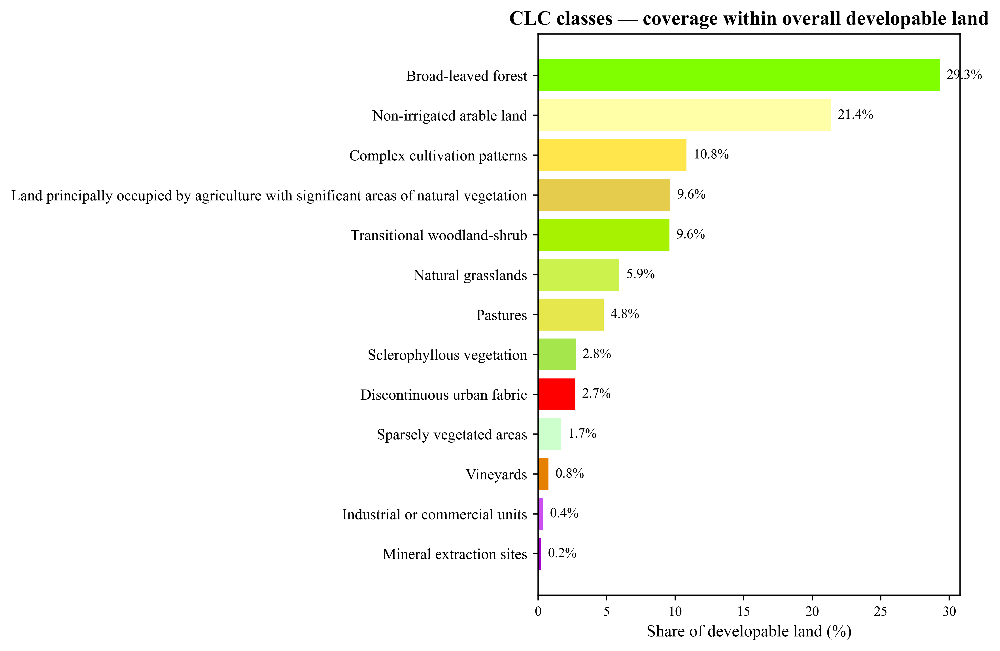

In [10]:
# --- Coverage by CLC class (percent of developable land) + plot ---

import numpy as np
import matplotlib.pyplot as plt

# Valid (developable) pixels are those not set to -1
valid = clc_masked >= 0
vals, counts = np.unique(clc_masked[valid], return_counts=True)
total = counts.sum()

# Safety: if no developable pixels, bail out gracefully
if total == 0:
    print("No developable pixels found in the current mask.")
else:
    # Percent of overall developable land
    pct = counts / total * 100.0

    # Optional: estimate area per class (km²) using raster grid spacing in projected CRS
    # (Your code reprojects to a projected CRS; if it's EPSG:3035, this is equal-area.)
    dx = float(np.abs(x[1] - x[0])) if len(x) > 1 else 1.0
    dy = float(np.abs(y[1] - y[0])) if len(y) > 1 else 1.0
    pixel_area_km2 = (dx * dy) / 1e6
    area_km2 = counts * pixel_area_km2
    total_area_km2 = area_km2.sum()

    # Build labels/colors
    labels = [id_to_name.get(int(v), f"Class {int(v)}") for v in vals]
    colors = [id_to_hex.get(int(v), "#888888") for v in vals]

    # Sort by percent descending
    order = np.argsort(pct)[::-1]
    vals_s   = vals[order]
    labels_s = [labels[i] for i in order]
    colors_s = [colors[i] for i in order]
    pct_s    = pct[order]
    area_s   = area_km2[order]

    # ---- Print a compact table
    print(f"Total developable area: {total_area_km2:,.1f} km² "
          f"(pixel ~ {pixel_area_km2:.2f} km²)")
    print("\nClass coverage (top to bottom = largest to smallest):")
    for lbl, p, a in zip(labels_s, pct_s, area_s):
        print(f"  • {lbl}: {p:5.1f}%  ({a:,.1f} km²)")

    # ---- Plot
    fig, ax = plt.subplots(figsize=(9, 6))
    y = np.arange(len(labels_s))
    bars = ax.barh(y, pct_s, color=colors_s, edgecolor='none')
    ax.set_yticks(y)
    ax.set_yticklabels(labels_s, fontsize=10)
    ax.invert_yaxis()  # largest on top
    ax.set_xlabel("Share of developable land (%)", fontsize=11)
    ax.set_title("CLC classes — coverage within overall developable land", fontsize=13, fontweight="bold")

    # Annotate percentages on bars
    for i, (b, p) in enumerate(zip(bars, pct_s)):
        ax.text(b.get_width() + 0.5, b.get_y() + b.get_height()/2,
                f"{p:.1f}%", va="center", fontsize=9)

    plt.tight_layout()
    plt.show()


In [12]:
existing_VREs_proj.head()

,country,Technology,Latitude,Longitude,RESource_region_code,geometry
0,ALB,Solar,40.711887,19.415809,AL,POINT (5118022.052 2006715.811)
1,ALB,Solar,40.768527,19.392888,AL,POINT (5115379.975 2012701.394)
2,ALB,Solar,40.852848,19.443786,AL,POINT (5118591.015 2022506.580)
3,BIH,Solar,42.790859,18.426209,BA,POINT (5010878.702 2225835.568)
4,BIH,Solar,43.083520,17.991905,BA,POINT (4972253.127 2254233.684)


In [13]:
# --- Sample CLC class at each existing plant point and export to Excel ---

import numpy as np
import pandas as pd
import geopandas as gpd
from pathlib import Path
from rasterio.transform import rowcol
import warnings

# -------------------- INPUTS --------------------
# 1) Your CLC raster as an xarray.DataArray with a CRS and transform
#    (already available as CLC_plot from your workflow)

# 2) Existing power plants (already loaded as GeoDataFrame or DataFrame)
df_plants = existing_VREs_proj  # make sure it has 'Latitude' and 'Longitude' columns

# 3) Mapping dictionaries
#    id_to_name: {class_id -> "Natural grasslands"}
# ------------------------------------------------

# --- Detect or define MW column ---
possible_mw_cols = [c for c in df_plants.columns if "mw" in c.lower()]
if len(possible_mw_cols) == 0:
    # If none found, you can rename your capacity column or specify manually here:
    MW_col = None
    print("⚠️ No MW column detected. If available, set MW_col = 'YourColumnName'.")
else:
    MW_col = possible_mw_cols[0]
    print(f"Detected MW column: '{MW_col}'")

# --- Build GeoDataFrame from lat/lon ---
src_crs = "EPSG:4326"  # update if different
gdf = gpd.GeoDataFrame(
    df_plants.copy(),
    geometry=gpd.points_from_xy(df_plants["Longitude"], df_plants["Latitude"]),
    crs=src_crs
)

# --- Ensure CRS alignment with the raster ---
raster_crs = CLC_plot.rio.crs
if raster_crs is None:
    raise ValueError("CLC_plot has no CRS. Please ensure CLC_plot.rio.crs is set.")

gdf_r = gdf.to_crs(raster_crs)

# --- Prepare raster data & transform ---
arr = np.asarray(CLC_plot.values).squeeze()
if arr.ndim != 2:
    raise ValueError("CLC_plot must be a single-band raster (2D array).")

transform = CLC_plot.rio.transform()
height, width = arr.shape

# --- Vectorized row/col computation ---
xs = gdf_r.geometry.x.values
ys = gdf_r.geometry.y.values
rows, cols = rowcol(transform, xs, ys, op=lambda v: int(np.floor(v)))
rows, cols = np.asarray(rows), np.asarray(cols)

# Identify points outside bounds
out_of_bounds = (rows < 0) | (rows >= height) | (cols < 0) | (cols >= width)
if out_of_bounds.any():
    warnings.warn(f"{out_of_bounds.sum()} point(s) fall outside raster extent and will be marked NaN.")

# --- Sample raster values at each point ---
class_ids = np.full(len(gdf_r), np.nan)
valid_idx = np.where(~out_of_bounds)[0]
class_ids[valid_idx] = arr[rows[valid_idx], cols[valid_idx]]
class_ids = pd.Series(class_ids).round().astype("Int64")

# --- Map to human-friendly class names ---
def lookup_name(cid):
    if pd.isna(cid):
        return pd.NA
    return id_to_name.get(int(cid), f"Class {int(cid)}")

class_names = pd.Series([lookup_name(c) for c in class_ids], index=gdf_r.index, dtype="object")

# --- Assemble output table ---
out = gdf.copy()
out["CLC_Class_ID"] = class_ids
out["CLC_Class_Name"] = class_names

# Include MW column (if found)
if MW_col:
    out.rename(columns={MW_col: "Capacity_MW"}, inplace=True)
else:
    out["Capacity_MW"] = np.nan

# --- Optional summary by tech & CLC class ---
summary = (out.groupby(["Technology", "CLC_Class_ID", "CLC_Class_Name"])
              .agg(Sites=("country", "count"),
                   Total_MW=("Capacity_MW", "sum"))
              .reset_index()
              .sort_values(["Technology", "Sites"], ascending=[True, False]))

print("Sample counts by Technology and CLC class:")
print(summary.to_string(index=False))

# --- Save to Excel ---
out_path = Path("../outputs/power_plants_with_CLC.xlsx")
out_path.parent.mkdir(parents=True, exist_ok=True)


print(f"\nWrote annotated plants to: {out_path.resolve()}")


⚠️ No MW column detected. If available, set MW_col = 'YourColumnName'.
Sample counts by Technology and CLC class:
Technology  CLC_Class_ID                                                                        CLC_Class_Name  Sites  Total_MW
     Solar            12                                                             Non-irrigated arable land      9       0.0
     Solar            20                                                          Complex cultivation patterns      6       0.0
     Solar            18                                                                              Pastures      3       0.0
     Solar            32                                                              Sparsely vegetated areas      3       0.0
     Solar            21 Land principally occupied by agriculture with significant areas of natural vegetation      2       0.0
     Solar            28                                                             Sclerophyllous vegetation      2 

## Capacity and Scores

In [14]:
all_cells=[WB6_store[region]['cells'] for region in WB6_store]
WB6_cells = gpd.GeoDataFrame(pd.concat(all_cells, ignore_index=True), crs=all_cells[0].crs)

## Grid

In [15]:
all_lines=[WB6_store[region]['lines'] for region in WB6_store]
WB6_lines = gpd.GeoDataFrame(pd.concat(all_lines, ignore_index=True), crs=all_lines[0].crs)

In [16]:
# Convert to numeric
WB6_lines['voltage_kv'] = pd.to_numeric(WB6_lines['voltage'], errors='coerce') / 1000

# Define voltage bins
bins = [0, 12, 25, 132, 220, float("inf")]
labels = ["<12 kV", "12–25 kV", "25–132 kV", "132–220 kV", "≥220 kV"]
WB6_lines['voltage_class'] = pd.cut(WB6_lines['voltage_kv'], bins=bins, labels=labels, right=False)


- Plot gird

<Axes: >

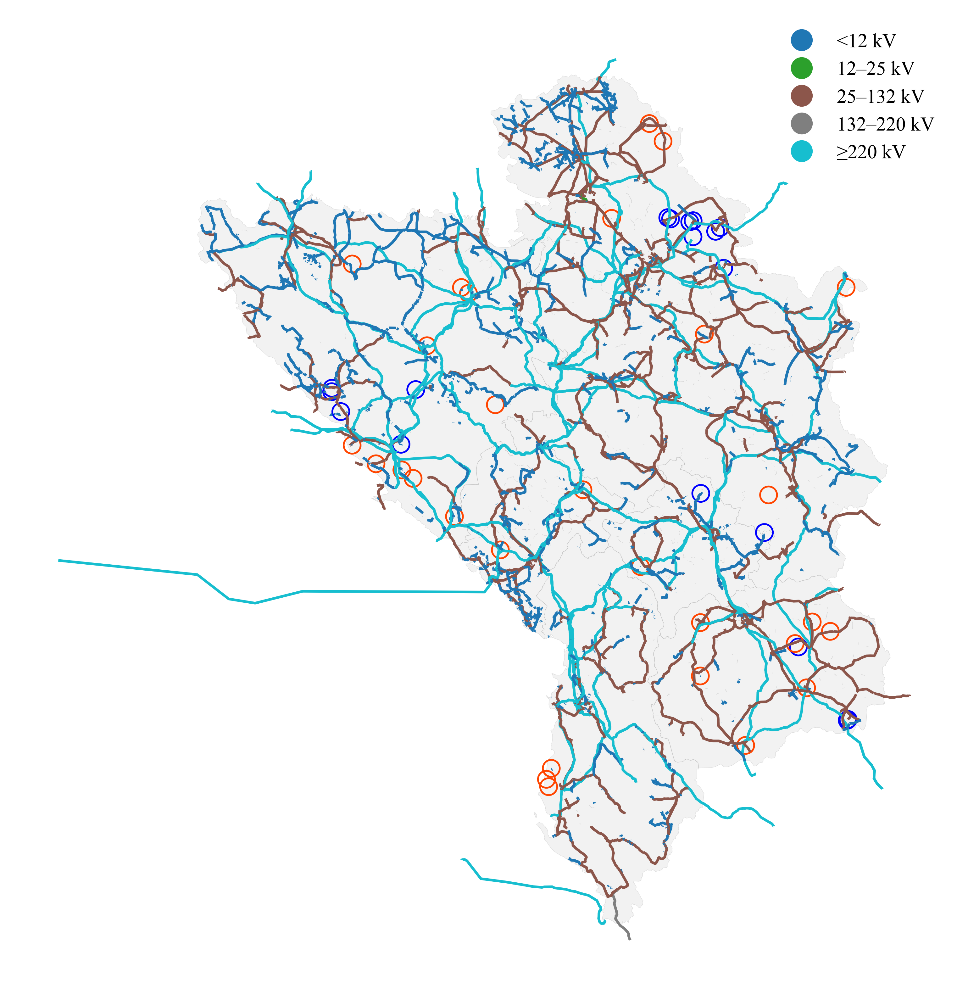

In [17]:
ax=WB6_boundary_dissolved.plot(edgecolor='black', facecolor='grey', linewidth=0.2, figsize=(10, 8),alpha=0.1)

ax.set_axis_off()

if existing_VREs_gdf is not None and not existing_VREs_gdf.empty:

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='wind'].plot(ax=ax, color='None', edgecolor='blue',markersize=60, linewidth=0.8,marker='o', label='Existing VREs',alpha=1,zorder=2)

    # Add legend for existing wind (purple)
    legend_handles = [Patch(facecolor='none', edgecolor='purple', label='Existing Wind', alpha=1)]
    ax.legend(handles=legend_handles, loc='upper left', fontsize=8, frameon=False)

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='solar'].plot(ax=ax, color='None', edgecolor='orangered',markersize=60,linewidth=0.8, marker='o', label='Existing VREs',alpha=1,zorder=2)
WB6_lines.plot('voltage_class',ax=ax, figsize=(10, 8), legend=True)

# Combined Maps

### Capacity Factor Map

* Individual Maps

In [18]:
# vis.get_data_in_map_plot(cells=cells, 
#                 resource_type='solar', 
#                 datafield='CF',
#                 title=f"Solar Resources for {region_name}",
#                 # ax=ax1,
#                 # font_family='sans-serif',
#                 show=False)

In [19]:
# vis.get_data_in_map_plot(cells, 
#                 resource_type='wind', 
#                   datafield='CF',
#                 title=f"Wind Resources for {region_name}",
#                 # ax=ax1, 
#                 show=False)

 └> Please cross check with Solar CF map with GLobal Solar Atlas Data from : https://globalsolaratlas.info/download/country_name


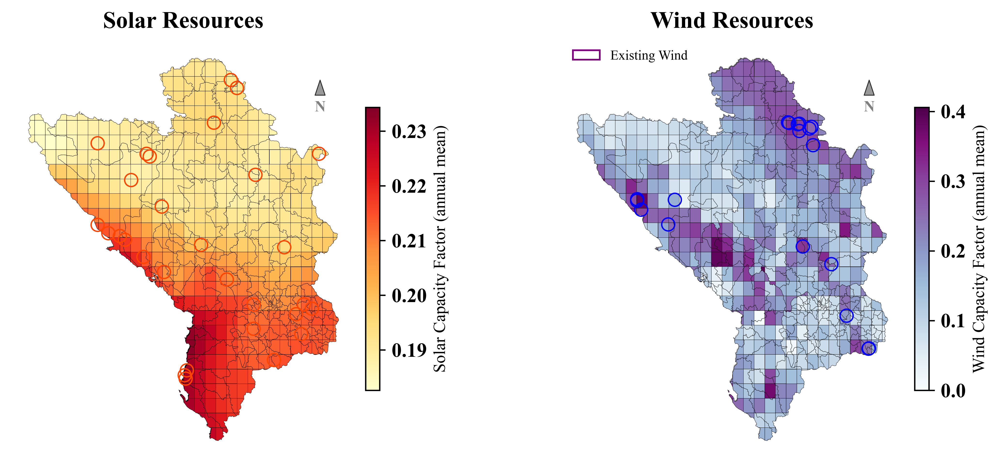

In [20]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=500)
# for double coulmn figure at 500 Dpi (72points per inch) minimum wide required is 3750 px, hence figsize=(7.5, 5) is recommended

# fig.suptitle(f"Resources for {region_name}", fontsize=18, fontweight='bold')

vis.get_data_in_map_plot(WB6_cells, 
                resource_type='solar',
                datafield='CF',
                ax=ax1, 
                show=False)
vis.get_data_in_map_plot(WB6_cells, 
                resource_type='wind',
                datafield='CF',
                ax=ax2, 
                show=False)

if existing_VREs_gdf is not None and not existing_VREs_gdf.empty:

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='wind'].plot(ax=ax2, color='None', edgecolor='blue',markersize=60, linewidth=0.8,marker='o', label='Existing VREs',alpha=1,zorder=2)

    # Add legend for existing wind (purple)
    legend_handles = [Patch(facecolor='none', edgecolor='purple', label='Existing Wind', alpha=1)]
    ax2.legend(handles=legend_handles, loc='upper left', fontsize=8, frameon=False)

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='solar'].plot(ax=ax1, color='None', edgecolor='orangered',markersize=60,linewidth=0.8, marker='o', label='Existing VREs',alpha=1,zorder=2)


vis.add_compass_arrow_custom(ax1, text_offset=0.04)
vis.add_compass_arrow_custom(ax2, text_offset=0.04)
plt.tight_layout()
plt.savefig(f"../vis/{country_kwd}/Resources_combined_CF.png", bbox_inches='tight', transparent=False)
plt.savefig("../docs/source/_static/Resources_combined_CF.png", bbox_inches='tight', transparent=False)

### Capacity

 └> Please cross check with Solar CF map with GLobal Solar Atlas Data from : https://globalsolaratlas.info/download/country_name


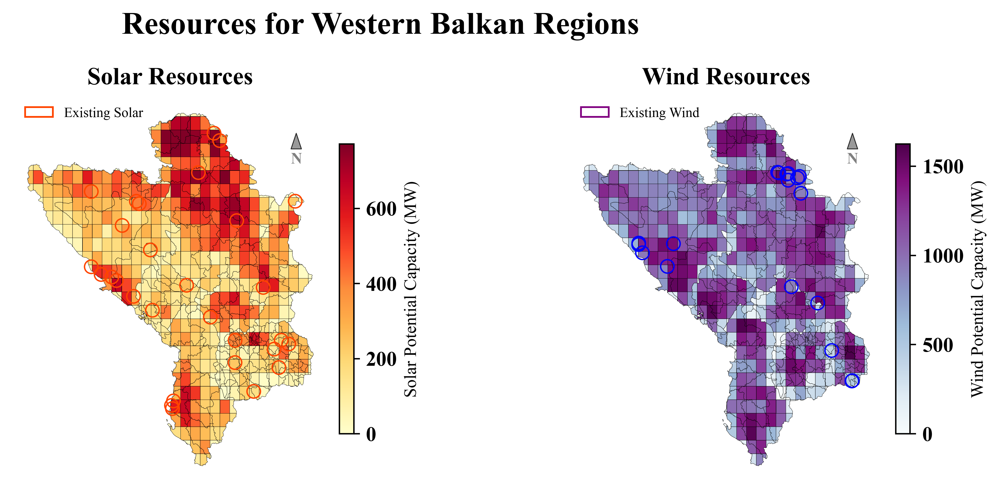

In [21]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=500)
# for double coulmn figure at 500 Dpi (72points per inch) minimum wide required is 3750 px, hence figsize=(7.5, 5) is recommended

fig.suptitle(f"Resources for {country_name}", fontsize=18, fontweight='bold')

vis.get_data_in_map_plot(WB6_cells, 
                resource_type='solar',
                datafield='capacity',
                ax=ax1, 
                show=False)
vis.get_data_in_map_plot(WB6_cells, 
                resource_type='wind',
                datafield='capacity',
                ax=ax2, 
                show=False)
vis.add_compass_arrow_custom(ax1, text_offset=0.04)
vis.add_compass_arrow_custom(ax2, text_offset=0.04)

if existing_VREs_gdf is not None and not existing_VREs_gdf.empty:

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='wind'].plot(ax=ax2, color='None', edgecolor='blue',markersize=60, linewidth=0.8,marker='o', label='Existing VREs',alpha=1,zorder=2)

    # Add legend for existing wind (purple)
    legend_handles = [Patch(facecolor='none', edgecolor='purple', label='Existing Wind', alpha=1)]
    ax2.legend(handles=legend_handles, loc='upper left', fontsize=8, frameon=False)

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='solar'].plot(ax=ax1, color='None', edgecolor='orangered',markersize=60,linewidth=0.8, marker='o', label='Existing VREs',alpha=1,zorder=2)

    # Add legend for existing wind (purple)
    legend_handles = [Patch(facecolor='none', edgecolor='orangered', label='Existing Solar', alpha=1)]
    ax1.legend(handles=legend_handles, loc='upper left', fontsize=8, frameon=False)


plt.tight_layout()
plt.savefig(f"../vis/{country_kwd}/Resources_combined_CAPACITY.png", bbox_inches='tight', transparent=False)
plt.savefig("../docs/source/_static/Resources_combined_CAPACITY.png", bbox_inches='tight', transparent=False)

In [22]:
WB6_cells_sum = WB6_cells.groupby('Country').sum(numeric_only=True)
# Map potential_capacity_solar and potential_capacity_wind to each country and get geometry
WB6_capacity_map = WB6_boundary_dissolved.copy()
WB6_capacity_map["potential_capacity_solar_GW"] = WB6_capacity_map["Country"].map(WB6_cells_sum["potential_capacity_solar"])/1E3
WB6_capacity_map["potential_capacity_wind_GW"] = WB6_capacity_map["Country"].map(WB6_cells_sum["potential_capacity_wind"])/1E3
WB6_capacity_map[["Country", "potential_capacity_solar_GW", "potential_capacity_wind_GW", "geometry"]]

,Country,potential_capacity_solar_GW,potential_capacity_wind_GW,geometry
0,Albania,34.230425,118.700035,"MULTIPOLYGON (((20.11530 39.66230, 20.08970 39..."
1,Bosnia and Herzegovina,44.591200,154.250726,"POLYGON ((18.98970 44.86140, 19.01000 44.86440..."
2,Kosovo,15.695617,43.974910,"POLYGON ((20.58290 41.90610, 20.58220 41.91140..."
3,Montenegro,14.973814,94.464244,"MULTIPOLYGON (((19.13790 41.99350, 19.13930 41..."
4,North Macedonia,54.742303,231.124068,"POLYGON ((20.93350 40.92080, 20.91140 40.91390..."
5,Serbia,129.736546,322.562421,"MULTIPOLYGON (((20.45120 42.91110, 20.45770 42..."


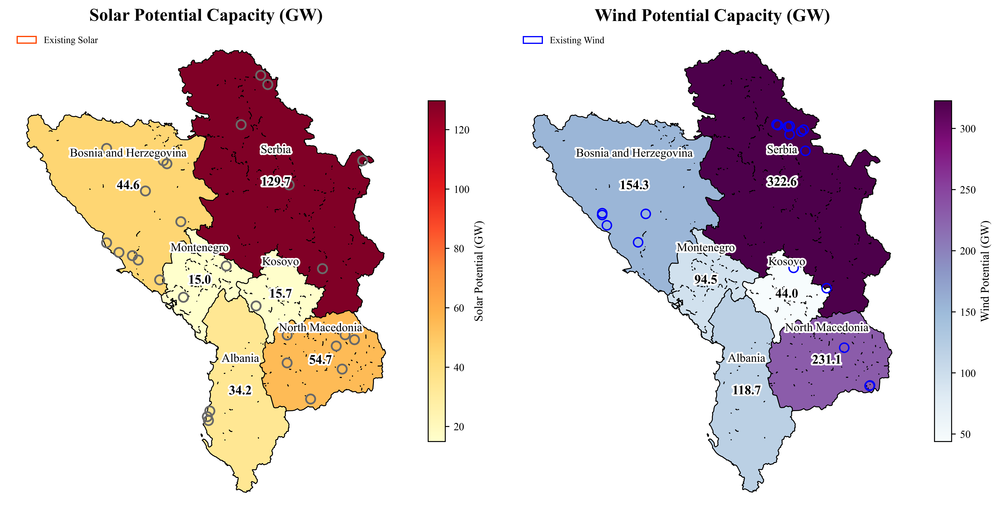

In [23]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), dpi=500)

# Plot solar capacity
WB6_capacity_map.plot(
    column="potential_capacity_solar_GW",
    cmap="YlOrRd",
    linewidth=0.8,
    edgecolor="k",
    legend=True,
    ax=ax1,
    legend_kwds={"label": "Solar Potential (GW)", "shrink": 0.7}
)
ax1.set_title("Solar Potential Capacity (GW)", fontsize=15, weight="bold")
ax1.set_axis_off()

# Annotate numbers and country names with white halo
for idx, row in WB6_capacity_map.iterrows():
    centroid = row.geometry.centroid
    val = row["potential_capacity_solar_GW"]
    # Capacity value
    ax1.annotate(
        f"{val:,.1f}",
        (centroid.x, centroid.y),
        color="black",
        fontsize=11,
        ha="center",
        va="center",
        fontweight="bold",
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )
    # Country name slightly above
    ax1.annotate(
        row["Country"],
        (centroid.x, centroid.y + 0.4),
        color="black",
        fontsize=10,
        ha="center",
        va="bottom",
        fontweight="normal",
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )

# Plot wind capacity
WB6_capacity_map.plot(
    column="potential_capacity_wind_GW",
    cmap="BuPu",
    linewidth=0.8,
    edgecolor="k",
    legend=True,
    ax=ax2,
    legend_kwds={"label": "Wind Potential (GW)", "shrink": 0.7}
)
ax2.set_title("Wind Potential Capacity (GW)", fontsize=15, weight="bold")
ax2.set_axis_off()

# Annotate numbers and country names with white halo
for idx, row in WB6_capacity_map.iterrows():
    centroid = row.geometry.centroid
    val = row["potential_capacity_wind_GW"]
    # Capacity value
    ax2.annotate(
        f"{val:,.1f}",
        (centroid.x, centroid.y),
        color="black",
        fontsize=11,
        ha="center",
        va="center",
        fontweight="bold",
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )
    # Country name slightly above
    ax2.annotate(
        row["Country"],
        (centroid.x, centroid.y + 0.4),
        color="black",
        fontsize=10,
        ha="center",
        va="bottom",
        fontweight="normal",
        path_effects=[pe.withStroke(linewidth=3, foreground="white")]
    )
if existing_VREs_gdf is not None and not existing_VREs_gdf.empty:

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='wind'].plot(ax=ax2, color='None', edgecolor='blue',markersize=60, linewidth=1.2,marker='o', label='Existing VREs',alpha=1,zorder=2)

    # Add legend for existing wind (purple)
    legend_handles = [Patch(facecolor='none', edgecolor='blue', label='Existing Wind', alpha=1)]
    ax2.legend(handles=legend_handles, loc='upper left', fontsize=8, frameon=False)

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='solar'].plot(ax=ax1, color='None', edgecolor='dimgray',markersize=60,linewidth=1.5, marker='o', label='Existing VREs',alpha=1,zorder=2)

    # Add legend for existing wind (purple)
    legend_handles = [Patch(facecolor='none', edgecolor='orangered', label='Existing Solar', alpha=1)]
    ax1.legend(handles=legend_handles, loc='upper left', fontsize=8, frameon=False)

plt.tight_layout()
plt.show()

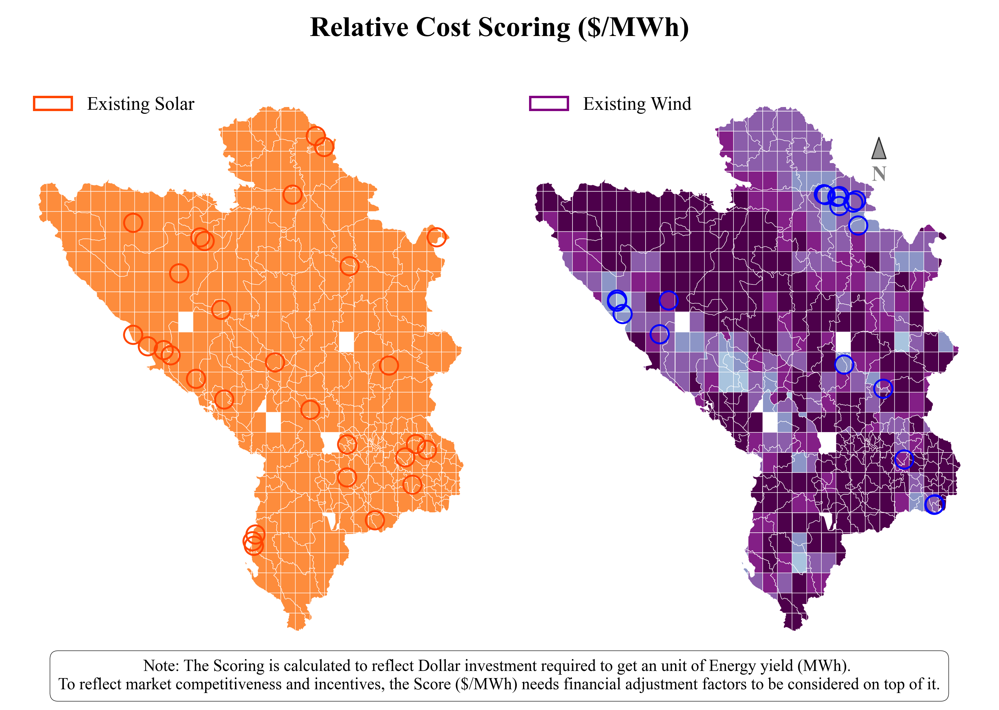

In [24]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd

# Ensure 'Region' is in the columns for both boundary and cells
# if 'Region' not in boundary.columns:
#     boundary = boundary.reset_index(inplace=True)

# # Assign a number to each region
# boundary['Region_Number'] = range(1, len(boundary) + 1)

# Define custom bins and labels for solar and wind capacity
solar_bins = [20, 30, 50, 70, 80, float('inf')]  # Custom ranges
solar_labels = ['<20','20-30', '30-55','50-70','>80']  # Labels for legend

# Define custom bins and labels for solar and wind capacity
wind_bins = [20, 30, 40, 50, 60, 80, 100, float('inf')]  # Custom ranges
wind_labels = ['<20','20-30', '30-40','40-50','50-60', '60-80', '>100']  # Labels for legend

# Categorize potential_capacity_solar and potential_capacity_wind into bins
WB6_cells['solar_category'] = pd.cut(WB6_cells['lcoe_solar'], bins=solar_bins, labels=solar_labels, include_lowest=True)
WB6_cells['wind_category'] = pd.cut(WB6_cells['lcoe_wind'], bins=wind_bins, labels=wind_labels, include_lowest=True)

# Create figure and axes for side-by-side plotting
fig, (ax1, ax2) = plt.subplots(figsize=(6, 4), ncols=2,dpi=500)
fig.suptitle("Relative Cost Scoring ($/MWh)", fontsize=12, fontweight='bold')
# Set axis off for both subplots
ax1.set_axis_off()
ax2.set_axis_off()

# Shadow effect offset
# shadow_offset = 0.001

# Plot solar map on ax1
# Add shadow effect for solar map
# boundary.geometry = boundary.geometry.translate(xoff=shadow_offset, yoff=-shadow_offset)
# boundary.plot(ax=ax1, facecolor='none', edgecolor='gray', linewidth=1.2, alpha=0.3)  # Shadow layer
# boundary.geometry = boundary.geometry.translate(xoff=-shadow_offset, yoff=shadow_offset)

# Plot solar cells
WB6_cells.plot(column='solar_category', ax=ax1, cmap='YlOrRd', legend=False, edgecolor='white',linewidth=0.2,alpha=1,
        #    legend_kwds={'title': "Solar",'title_fontsize':14, 'bbox_to_anchor':(legend_x_ax_offset,legend_y_ax_offset),'fontsize':14,'frameon': False}
           )

# # Plot actual boundary for solar map
# boundary.plot(ax=ax1, facecolor='none', edgecolor='black', linewidth=0.2, alpha=0.9)

""" 
# Annotate region numbers for solar map
for idx, row in boundary.iterrows():
    centroid = row.geometry.centroid
    ax1.annotate(f"{row['Region_Number']}", 
                 xy=(centroid.x, centroid.y), 
                 ha='center', va='center',
                 fontsize=7, color='black',
                 bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, boxstyle='round,pad=0.2'))
"""
# Plot wind map on ax2
# Add shadow effect for wind map
# boundary.geometry = boundary.geometry.translate(xoff=shadow_offset, yoff=-shadow_offset)
# boundary.plot(ax=ax2, color='None', edgecolor='k', linewidth=0.2, alpha=0.7)  # Shadow layer
# boundary.geometry = boundary.geometry.translate(xoff=-shadow_offset, yoff=shadow_offset)

# Plot wind cells
WB6_cells.plot(column='wind_category', ax=ax2, cmap='BuPu', legend=False, edgecolor='white',linewidth=0.2,alpha=1,
        #    legend_kwds={'title': "Wind", 'title_fontsize':14, 'bbox_to_anchor':(legend_x_ax_offset,legend_y_ax_offset),'fontsize':14,'frameon': False}
           )

# Plot actual boundary for wind map
# boundary.plot(ax=ax2, facecolor='none', edgecolor='black', linewidth=0.2, alpha=0.9)
"""
# Annotate region numbers for wind map
for idx, row in boundary.iterrows():
    centroid = row.geometry.centroid
    ax2.annotate(f"{row['Region_Number']}", 
                 xy=(centroid.x, centroid.y), 
                 ha='center', va='center',
                 fontsize=8, color='black',
                 bbox=dict(facecolor='white', edgecolor='none', alpha=0.7, boxstyle='round,pad=0.2'))
"""
# Adjust layout for cleaner appearance
fig.patch.set_alpha(0)  # Make figure background transparent
# Add annotation to the figure
fig.text(0.5, 0.01, 
         "Note: The Scoring is calculated to reflect Dollar investment required to get an unit of Energy yield (MWh). "
         "\nTo reflect market competitiveness and incentives, the Score ($/MWh) needs financial adjustment factors to be considered on top of it.",
         ha='center', va='center', fontsize=7, color='k', bbox=dict(facecolor='None', edgecolor='k',linewidth=0.2,boxstyle='round,pad=0.5'))
plt.tight_layout()
if existing_VREs_gdf is not None and not existing_VREs_gdf.empty:

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='wind'].plot(ax=ax2, color='None', edgecolor='blue',markersize=60, linewidth=0.8,marker='o', label='Existing VREs',alpha=1,zorder=2)

    # Add legend for existing wind (purple)
    legend_handles = [Patch(facecolor='none', edgecolor='purple', label='Existing Wind', alpha=1)]
    ax2.legend(handles=legend_handles, loc='upper left', fontsize=8, frameon=False)

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='solar'].plot(ax=ax1, color='None', edgecolor='orangered',markersize=60,linewidth=0.8, marker='o', label='Existing VREs',alpha=1,zorder=2)

    # Add legend for existing wind (purple)
    legend_handles = [Patch(facecolor='none', edgecolor='orangered', label='Existing Solar', alpha=1)]
    ax1.legend(handles=legend_handles, loc='upper left', fontsize=8, frameon=False)

# Show the side-by-side plot
# vis.add_compass_arrow_custom(ax1,text_offset=0.03)
vis.add_compass_arrow_custom(ax2,x=0.78,text_offset=0.04)
plt.savefig('../vis/WesternBalkanRegions/solar_wind_score_map.jpg')

/var/folders/p8/lwc0sjsd4g3brnjz6n_q8chc0000gn/T/ipykernel_22978/2662074183.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  solar_cmap = cm.get_cmap('YlOrRd', len(solar_labels))
/var/folders/p8/lwc0sjsd4g3brnjz6n_q8chc0000gn/T/ipykernel_22978/2662074183.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  wind_cmap = cm.get_cmap('BuPu', len(wind_labels))
/var/folders/p8/lwc0sjsd4g3brnjz6n_q8chc0000gn/T/ipykernel_22978/2662074183.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future

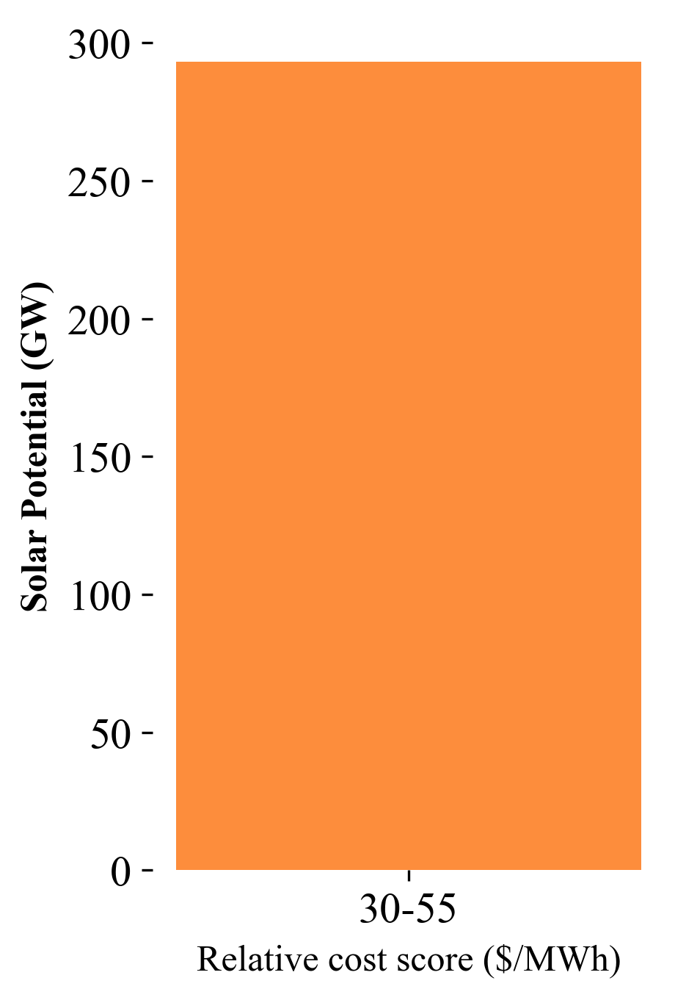

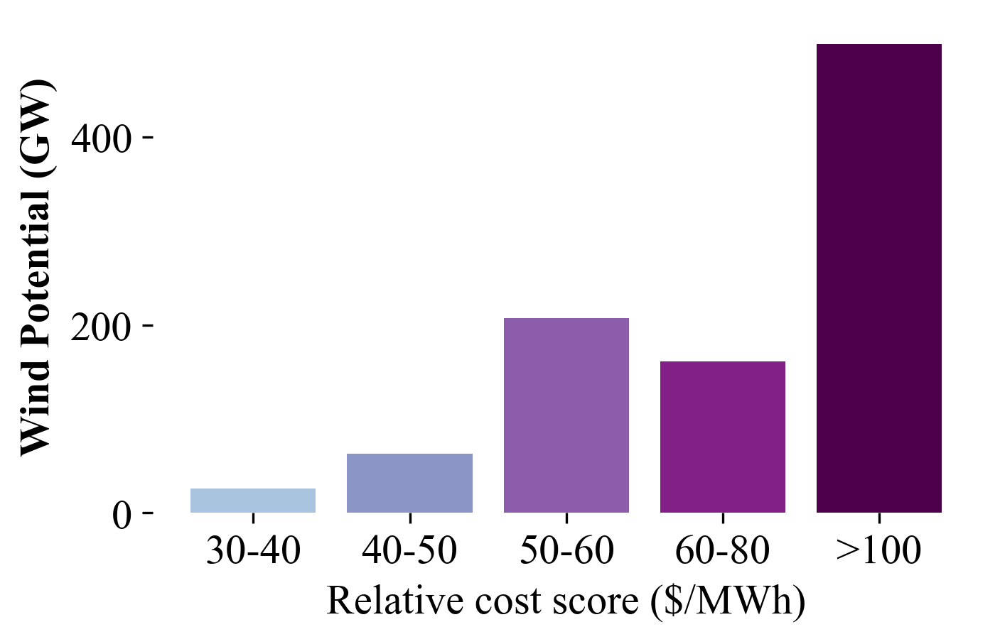

In [25]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt

# Define colormaps
solar_cmap = cm.get_cmap('YlOrRd', len(solar_labels))
wind_cmap = cm.get_cmap('BuPu', len(wind_labels))

# Generate colors for each bin
solar_colors = [mcolors.rgb2hex(solar_cmap(i)) for i in range(len(solar_labels))]
wind_colors = [mcolors.rgb2hex(wind_cmap(i)) for i in range(len(wind_labels))]

# Aggregate potential capacity for each bin
solar_capacity = (
    WB6_cells.groupby('solar_category')['potential_capacity_solar']
    .sum().div(1e3)
    .reindex(solar_labels, fill_value=0)
)
wind_capacity = (
    WB6_cells.groupby('wind_category')['potential_capacity_wind']
    .sum().div(1e3)
    .reindex(wind_labels, fill_value=0)
)

# --- Drop bins with 0 capacity ---
solar_capacity = solar_capacity[solar_capacity > 0]
wind_capacity = wind_capacity[wind_capacity > 0]

solar_colors_filtered = [solar_colors[solar_labels.index(lbl)] for lbl in solar_capacity.index]
wind_colors_filtered = [wind_colors[wind_labels.index(lbl)] for lbl in wind_capacity.index]

### Solar Plot ###
fig1, ax1 = plt.subplots(figsize=(3, 5), dpi=300)
fig1.patch.set_alpha(0)          # transparent figure background
ax1.set_facecolor('none')        # transparent axis background

ax1.bar(solar_capacity.index, solar_capacity.values, color=solar_colors_filtered, edgecolor='none')
ax1.set_ylabel('Solar Potential (GW)', fontsize=12, weight='bold')
ax1.set_xlabel('Relative cost score ($/MWh)', fontsize=12)

ax1.grid(False)  # Remove grid lines

# Clean look
for spine in ax1.spines.values():
    spine.set_visible(False)
ax1.tick_params(bottom=True, left=True, labelsize=14)

plt.savefig('../vis/WesternBalkanRegions/solar_wind_score_bar1.png', transparent=True)

### Wind Plot ###
fig2, ax2 = plt.subplots(figsize=(5, 3), dpi=300)
fig2.patch.set_alpha(0)
ax2.set_facecolor('none')

ax2.bar(wind_capacity.index, wind_capacity.values, color=wind_colors_filtered, edgecolor='none')
ax2.set_ylabel('Wind Potential (GW)', fontsize=14, weight='bold')
ax2.set_xlabel('Relative cost score ($/MWh)', fontsize=14)

ax2.grid(False)  # Remove grid lines

for spine in ax2.spines.values():
    spine.set_visible(False)
ax2.tick_params(bottom=True, left=True, labelsize=14)

plt.savefig('../vis/WesternBalkanRegions/solar_wind_score_bar2.png', transparent=True)


### Score

 └> Please cross check with Solar CF map with GLobal Solar Atlas Data from : https://globalsolaratlas.info/download/country_name


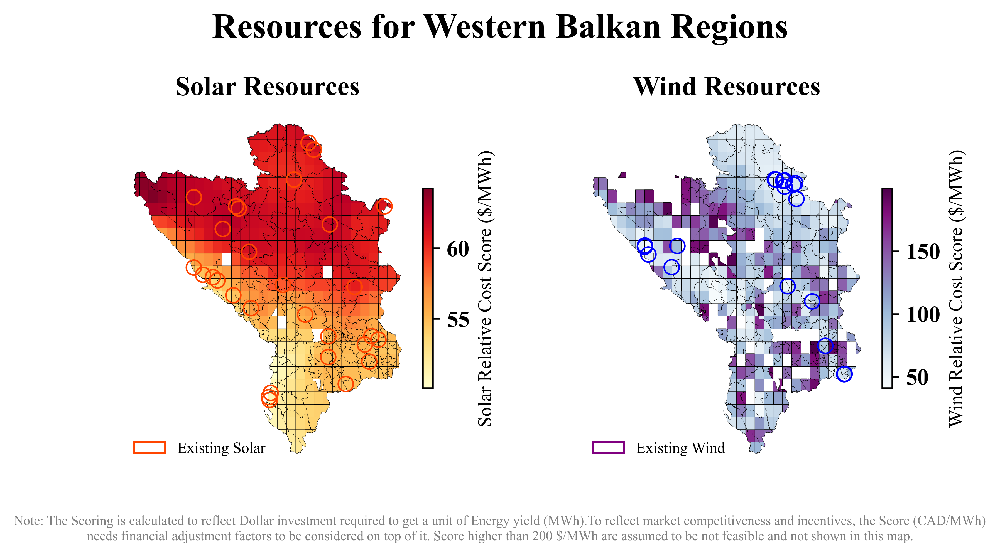

In [26]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7, 3.5), dpi=500)
# for double coulmn figure at 500 Dpi (72points per inch) minimum wide required is 3750 px, hence figsize=(7.5, 5) is recommended

fig.suptitle(f"Resources for {country_name}", fontsize=18, fontweight='bold')

vis.get_data_in_map_plot(WB6_cells, 
                resource_type='solar',
                datafield='score',
                compass_size=12,
                ax=ax1, 
                show=False)
vis.get_data_in_map_plot(WB6_cells, 
                resource_type='wind',
                datafield='score',
                ax=ax2, 
                show=False)
fig.text(
    0.5, -0.05,
    "Note: The Scoring is calculated to reflect Dollar investment required to get a unit of Energy yield (MWh).To reflect market competitiveness and incentives, the Score (CAD/MWh) needs financial adjustment factors to be considered on top of it. Score higher than 200 $/MWh are assumed to be not feasible and not shown in this map.",
    ha='center', va='top', fontsize=7, color='gray',wrap=True,
)
if existing_VREs_gdf is not None and not existing_VREs_gdf.empty:

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='wind'].plot(ax=ax2, color='None', edgecolor='blue',markersize=60, linewidth=0.8,marker='o', label='Existing VREs',alpha=1,zorder=2)

    # Add legend for existing wind (purple)
    legend_handles = [Patch(facecolor='none', edgecolor='purple', label='Existing Wind', alpha=1)]
    ax2.legend(handles=legend_handles, loc='lower left', fontsize=8, frameon=False)

    existing_VREs_gdf[existing_VREs_gdf['Technology'].str.lower()=='solar'].plot(ax=ax1, color='None', edgecolor='orangered',markersize=60,linewidth=0.8, marker='o', label='Existing VREs',alpha=1,zorder=2)

# Add legend for existing wind (purple)
legend_handles = [Patch(facecolor='none', edgecolor='orangered', label='Existing Solar', alpha=1)]
ax1.legend(handles=legend_handles, loc='lower left', fontsize=8, frameon=False)

plt.tight_layout()

plt.savefig(f"../vis/{country_kwd}/Resources_combined_SCORE.png", bbox_inches='tight', transparent=False)
plt.savefig("../docs/source/_static/Resources_combined_SCORE.png", bbox_inches='tight', transparent=False)